<a href="https://colab.research.google.com/github/As1nth/cognifiz_internship/blob/main/Level2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster

In [2]:
sns.set_style("whitegrid")

In [3]:
from google.colab import files
uploaded = files.upload()

Saving Dataset .csv to Dataset .csv


In [4]:
df = pd.read_csv("Dataset .csv")

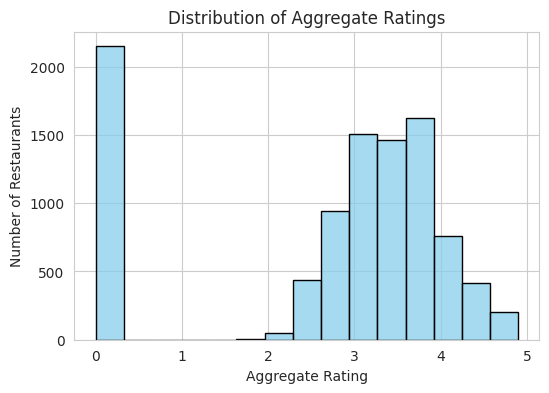

In [5]:
#Task_One
plt.figure(figsize=(6,4))
sns.histplot(df['Aggregate rating'], bins=15, kde=False, color="skyblue", edgecolor="black")
plt.title("Distribution of Aggregate Ratings")
plt.xlabel("Aggregate Rating")
plt.ylabel("Number of Restaurants")
plt.show()

In [6]:
most_common_rating = df['Aggregate rating'].mode()[0]
print(f" Most common aggregate rating: {most_common_rating}")

 Most common aggregate rating: 0.0


In [7]:
avg_votes = df['Votes'].mean()
print(f" Average number of votes per restaurant: {avg_votes:.2f}")


 Average number of votes per restaurant: 156.91


In [9]:
#Task_Two
cuisine_combos = df['Cuisines'].dropna().apply(
    lambda x: tuple(sorted([c.strip() for c in x.split(',')]))
)
combo_counts = pd.Series(cuisine_combos).value_counts()
top_10_combos = combo_counts.head(10)

print("\n Top 10 most common cuisine combinations:")
print(top_10_combos)

combo_df = pd.DataFrame({
    "Cuisine Combo": cuisine_combos,
    "Rating": df['Aggregate rating']
})
avg_rating_combo = combo_df.groupby("Cuisine Combo")["Rating"].mean().sort_values(ascending=False)

print("\n Top 5 cuisine combinations by average rating:")
print(avg_rating_combo.head(5))


 Top 10 most common cuisine combinations:
Cuisines
(North Indian,)                     936
(Chinese, North Indian)             616
(Mughlai, North Indian)             394
(Fast Food,)                        354
(Chinese,)                          354
(Chinese, Mughlai, North Indian)    306
(Cafe,)                             299
(Bakery,)                           218
(Bakery, Desserts)                  181
(Chinese, Fast Food)                159
Name: count, dtype: int64

 Top 5 cuisine combinations by average rating:
Cuisine Combo
(World Cuisine,)                     4.9
(American, BBQ, Sandwich)            4.9
(American, Healthy Food, Mexican)    4.9
(American, Coffee and Tea)           4.9
(American, Caribbean, Seafood)       4.9
Name: Rating, dtype: float64


In [11]:
#Task_Three
center_lat = df['Latitude'].mean()
center_long = df['Longitude'].mean()

restaurant_map = folium.Map(location=[center_lat, center_long], zoom_start=2)

marker_cluster = MarkerCluster().add_to(restaurant_map)

for _, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Restaurant Name']} - {row['Aggregate rating']}",
        tooltip=row['Restaurant Name']
    ).add_to(marker_cluster)

print("\n Interactive map with restaurant clusters (zoom in to explore):")
restaurant_map


 Interactive map with restaurant clusters (zoom in to explore):



 Top 10 restaurant chains by number of outlets:
Restaurant Name
Cafe Coffee Day     83
Domino's Pizza      79
Subway              63
Green Chick Chop    51
McDonald's          48
Keventers           34
Pizza Hut           30
Giani               29
Baskin Robbins      28
Barbeque Nation     26
Name: count, dtype: int64

 Restaurant chain ratings & popularity:
                  Average Rating  Total Votes  Number of Outlets
Restaurant Name                                                 
Cafe Coffee Day         2.419277         2428                 83
Domino's Pizza          2.740506         6643                 79
Subway                  2.907937         6124                 63
Green Chick Chop        2.672549          964                 51
McDonald's              3.339583         5291                 48
Keventers               2.870588         1263                 34
Pizza Hut               3.320000         4961                 30
Giani                   2.689655          854        

/tmp/ipython-input-633179772.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=chains.head(10).values, y=chains.head(10).index, palette="Blues_r")


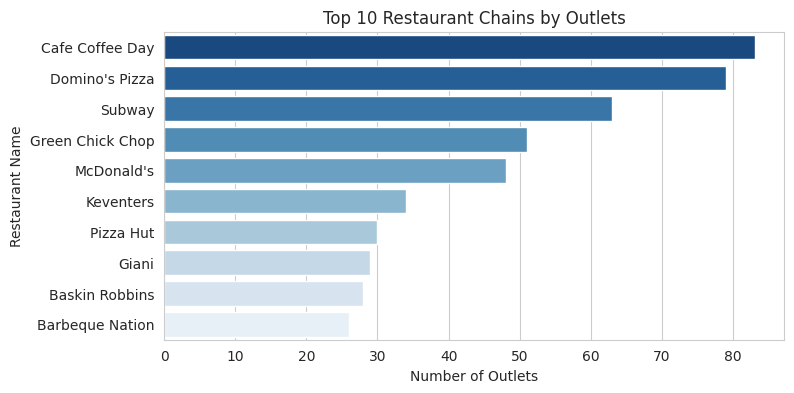

In [12]:
#Task_Four
restaurant_counts = df['Restaurant Name'].value_counts()
chains = restaurant_counts[restaurant_counts > 1]

print("\n Top 10 restaurant chains by number of outlets:")
print(chains.head(10))

chain_ratings = df[df['Restaurant Name'].isin(chains.index)].groupby('Restaurant Name')['Aggregate rating'].mean()
chain_popularity = df[df['Restaurant Name'].isin(chains.index)].groupby('Restaurant Name')['Votes'].sum()

chain_analysis = pd.DataFrame({
    "Average Rating": chain_ratings,
    "Total Votes": chain_popularity,
    "Number of Outlets": chains
}).sort_values(by="Number of Outlets", ascending=False)

print("\n Restaurant chain ratings & popularity:")
print(chain_analysis.head(10))

plt.figure(figsize=(8,4))
sns.barplot(x=chains.head(10).values, y=chains.head(10).index, palette="Blues_r")
plt.title("Top 10 Restaurant Chains by Outlets")
plt.xlabel("Number of Outlets")
plt.ylabel("Restaurant Name")
plt.show()